In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalMaxPool2D, GlobalAveragePooling2D
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

In [2]:
import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if tf.config.list_physical_devices('GPU'):
    print("GPU is available")
else:
    print("GPU is not available, please check your installation")


Num GPUs Available:  1
GPU is available


In [3]:
# dataset을 training set과 validation set으로 나누기 8:2비율
batch_size = 32
img_height = 224
img_width = 224

image_directory = './Digital images of defective and good condition tyres'

train_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율 (여기서는 20%를 검증 데이터로 사용)
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='training',  # 훈련 데이터셋을 생성하기 위해 'training' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

class_names=train_data.class_names
print(class_names)

# validation data 만들기
val_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='validation',  # 검증 데이터셋을 생성하기 위해 'validation' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

Found 1856 files belonging to 2 classes.
Using 1485 files for training.
['defective', 'good']
Found 1856 files belonging to 2 classes.
Using 371 files for validation.


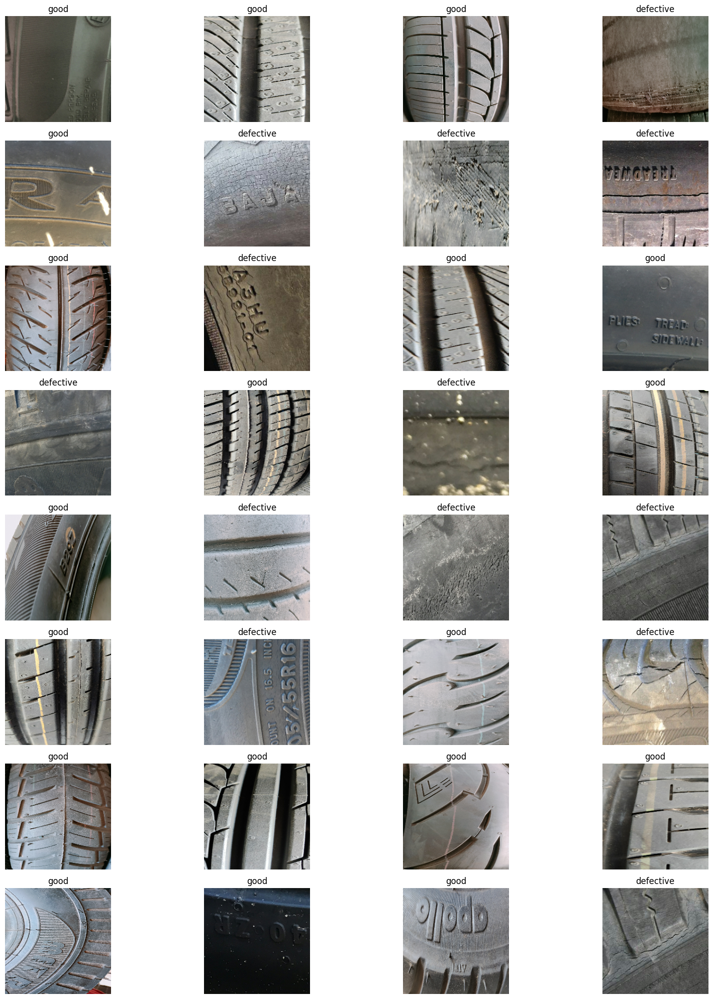

In [4]:
# Plot the images
plt.figure(figsize=(20,20), tight_layout=True, facecolor="white")
for image, label in train_data.take(1):
    for i in range(32):
        ax=plt.subplot(8, 4, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        plt.title(class_names[label[i]])
        plt.axis("off")

# 전이 학습을 통한 모델 훈련

In [5]:
import tensorflow as tf

# 사전 훈련된 모델 내려받기 (VGG19 전이학습) -> 베이스모델 생성
# include_top=False : 마지막 분류 레이어 제외(이로 인해 모델의 출력은 특징 맵이 된다)
base_model = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')

# 베이스 모델 동결: 가중치가 변경되지 않도록 함. 사전 학습된 패턴이 그대로 유지
base_model.trainable = False

# 입력 레이어 생성: 입력 이미지(224,224,3) 형태로 이 입력이 베이스 모델을 통해 처리
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model(inputs)

# 베이스 모델을 통과한 후 출력 데이터의 형태를 확인
print(f"Shape after base_model: {x.shape}")

# 글로벌 평균 풀링 및 추가 레이어 추가
# 글로벌 평균 풀링 레이어를 사용하여 출력 특징 맵을 평탄화 함
# 추가로 밀집 레이어를 추가하여 네트워크의 학습 능력을 향상 시킴
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(512, activation="relu")(x)
# x = tf.keras.layers.Dropout(0.5)(x)

# 출력 레이어 생성: 시그모이드 활성화 함수를 사용하여 이진 분류를 수행
# '1': 뉴런의 수 = 1, 출력 레이어에 하나의 뉴런만 있으면 특정 임계값을 기준으로 두 클래스 중 하나로 분류가능
# 시그모이드 활성화 함수는 출력 값을 0과 1사이의 확률 값으로 변환(0에 가까움: 정상(0), 1에 가까움: 불량(1))
outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# 모델 생성 및 컴파일
# 이진 분류를 위한 손실 함수로 'BinaryCrossentropy' 사용
# Adam 옵티마이저와 정확도를 메트릭으로 사용
model = tf.keras.Model(inputs, outputs, name="model")

model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics=["accuracy"])

# 콜백 설정
# ReduceLROnPlateau: 검증 손실이 개선되지 않을 때 학습률을 감소시킴
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",   # 성능을 모니터링할 지표, 여기서는 검증 손실을 사용
    patience=2,           # 지정된 에포크 동안 모니터링 지표가 개선되지 않으면 학습률을 조정
    factor=0.5,           # 학습률을 감소시킬 비율, 여기서는 학습률을 50%로 줄임
    min_lr=0.00001,       # 학습률의 최솟값, 이 값 이하로 학습률이 떨어지지 않음
    verbose=1             # 콜백 실행 시 학습률 조정 내용을 출력 (학습률 조정이 있을 때마다 메시지 출력)
)

# EarlyStopping: 검증 손실이 개선되지 않을 때 훈련을 조기 종료, 가장 좋은 가중치를 복원
# 이것을 통해 과적합 방지, 훈련 시간 단축, 최적 모델 가중치 복원의 효과 
Early_Stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",           # 모니터링할 지표, 여기서는 검증 손실을 사용
    patience=5,                   # 개선되지 않을 때까지 기다릴 에포크 수(해당 에폭 동안 개선되지 않을 시 종료)
    restore_best_weights=True     # 가장 좋은 모델 가중치를 복원(가장 낮은 검증 손실 보인 모델 가중치로 복원)
)



Shape after base_model: (None, 7, 7, 512)


In [ ]:
history = model.fit(
    train_data,                    # 훈련 데이터셋
    epochs=100,                      # 전체 데이터셋을 훈련할 횟수
    validation_data=val_data,      # 검증 데이터셋 (훈련 중 각 에폭이 끝날 때마다 검증 데이터셋으로 모델의 성능 평가)
    callbacks=[Early_Stopping, learning_rate_reduction], # 콜백 함수 목록
    verbose=1                      # 훈련 과정의 상세 출력을 지정 (1: 상세 출력, 0: 출력 없음)
)


Epoch 1/100
47/47 [==============================] - 18s 246ms/step - loss: 0.5575 - accuracy: 0.8498 - val_loss: 0.5277 - val_accuracy: 0.8733 - lr: 0.0010
Epoch 2/100
47/47 [==============================] - 10s 182ms/step - loss: 0.2265 - accuracy: 0.9239 - val_loss: 0.3047 - val_accuracy: 0.8976 - lr: 0.0010
Epoch 3/100
47/47 [==============================] - 10s 186ms/step - loss: 0.1244 - accuracy: 0.9549 - val_loss: 0.2234 - val_accuracy: 0.9353 - lr: 0.0010
Epoch 4/100
47/47 [==============================] - 10s 195ms/step - loss: 0.0571 - accuracy: 0.9805 - val_loss: 0.1767 - val_accuracy: 0.9461 - lr: 0.0010
Epoch 5/100
47/47 [==============================] - 11s 196ms/step - loss: 0.0243 - accuracy: 0.9953 - val_loss: 0.1789 - val_accuracy: 0.9488 - lr: 0.0010
Epoch 6/100
47/47 [==============================] - 9s 178ms/step - loss: 0.0153 - accuracy: 0.9993 - val_loss: 0.1681 - val_accuracy: 0.9488 - lr: 0.0010
Epoch 7/100
47/47 [==============================] - 10s 19

In [7]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, None, None, 512)   20024384  
                                                                 
 global_average_pooling_laye  (None, 512)              0         
 r (GlobalAveragePooling2D)                                      
                                                                 
 flatten (Flatten)           (None, 512)               0         
                                                                 
 dense (Dense)               (None, 512)               262656    
                                                                 
 output_layer (Dense)        (None, 1)                 513       
                                                             

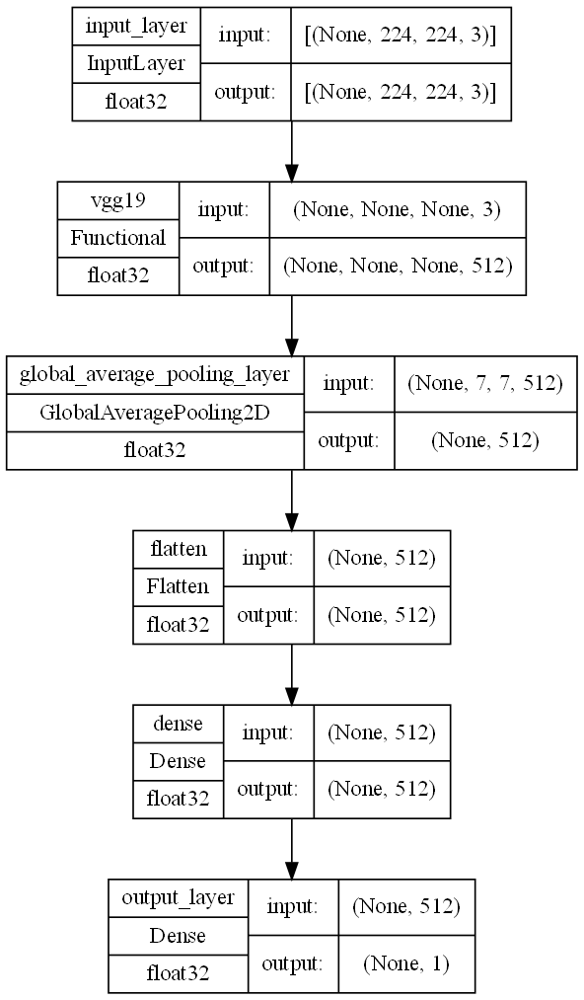

In [8]:
tf.keras.utils.plot_model(
    model,                 # 시각화할 Keras 모델
    show_shapes=True,      # 각 레이어의 출력 형태를 시각화에 포함할지 여부(True: 각 레이어별 출력 텐서 표시)
    show_layer_names=True, # 각 레이어의 이름을 시각화에 포함할지 여부
    show_dtype=True,       # 각 레이어의 데이터 타입을 시각화에 포함할지 여부
    dpi=120                # 시각화 이미지의 해상도 설정 (점 per 인치) (높은 dpi 높은 해상도)
)

In [9]:
import pandas as pd

# history.history 속성을 사용하여 DataFrame 생성
history_dict = history.history
dataframe = pd.DataFrame(history_dict)

# DataFrame 출력
print(dataframe)


        loss  accuracy  val_loss  val_accuracy       lr
0   0.970202  0.804714  0.253990      0.913747  0.00100
1   0.160273  0.941414  0.170899      0.940701  0.00100
2   0.076352  0.968350  0.147334      0.954178  0.00100
3   0.043236  0.990572  0.131955      0.956873  0.00100
4   0.026548  0.996633  0.139502      0.954178  0.00100
5   0.017553  0.999327  0.129766      0.956873  0.00100
6   0.012251  1.000000  0.135444      0.954178  0.00100
7   0.008968  1.000000  0.132636      0.959569  0.00100
8   0.006864  1.000000  0.144005      0.951482  0.00050
9   0.006180  1.000000  0.142991      0.956873  0.00050
10  0.005497  1.000000  0.145756      0.954178  0.00025


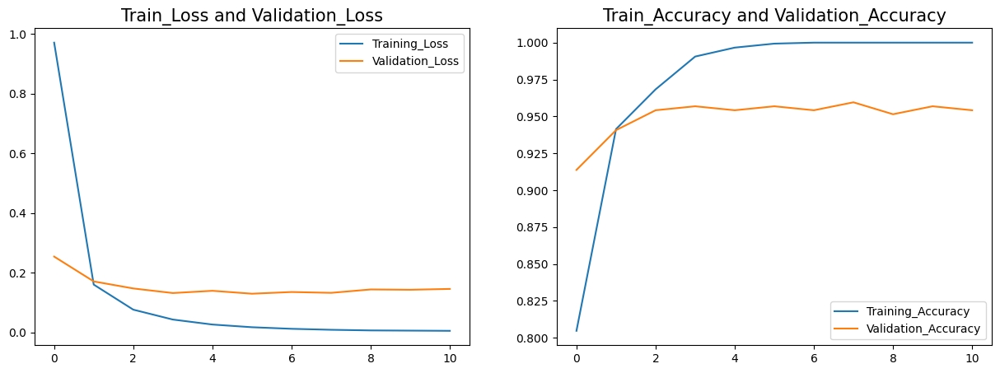

In [10]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(dataframe["loss"], label="Training_Loss")
plt.plot(dataframe["val_loss"], label="Validation_Loss")
plt.title('Train_Loss and Validation_Loss',fontsize=15)
plt.legend()

plt.subplot(1,2,2)
plt.plot(dataframe["accuracy"], label="Training_Accuracy")
plt.plot(dataframe["val_accuracy"], label="Validation_Accuracy")
plt.title('Train_Accuracy and Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [11]:
loss, accuracy=model.evaluate(val_data)
print(f"Accuracy:{accuracy}")
print(f"Loss:{loss}")

12/12 [==============================] - 2s 89ms/step - loss: 0.1298 - accuracy: 0.9569
Accuracy:0.9568732976913452
Loss:0.129765585064888


In [12]:
x_val=[]
y_val=[]


for image, label in val_data:
    x_val.extend(image.numpy())
    y_val.extend(label.numpy())    

In [13]:
# Lets make the Predictions
predictions=model.predict(np.array(x_val))

y_pred=[int(np.round(prediction)) for prediction in predictions]

12/12 [==============================] - 1s 69ms/step


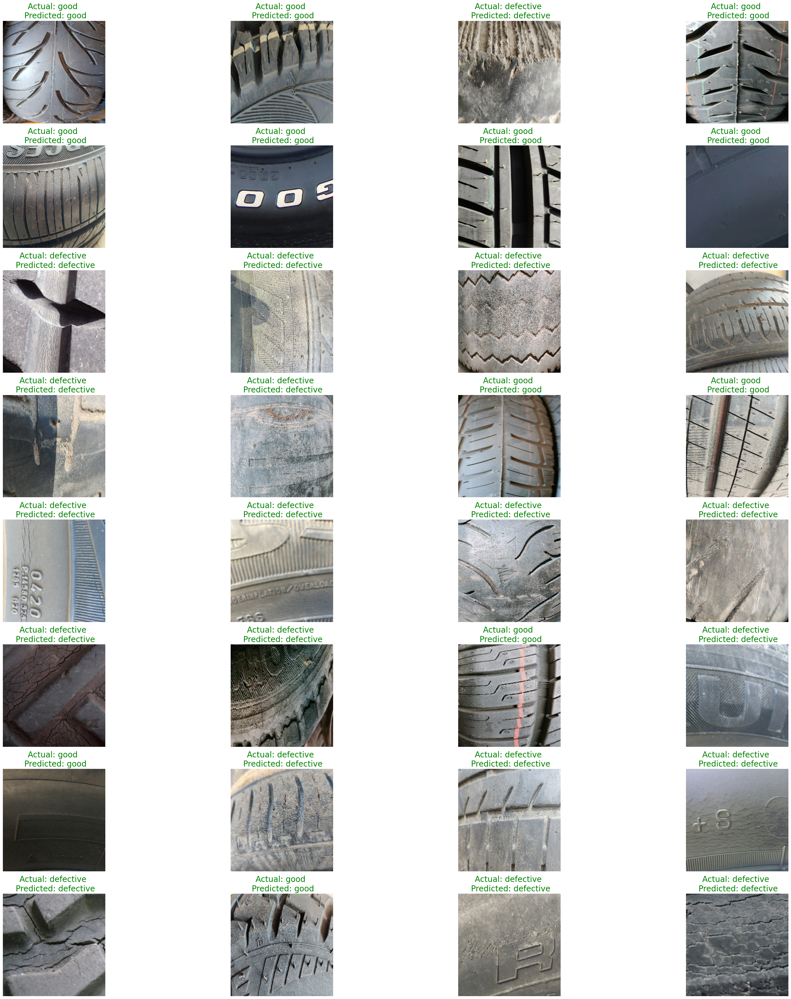

In [14]:
plt.figure(figsize=(35, 35),tight_layout=True, facecolor="white")


for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(x_val[i].astype("uint8"))
    actual_label = class_names[y_val[i]]
    predicted_label = class_names[y_pred[i]]
    
    # Check if the actual and predicted labels are the same
    if actual_label == predicted_label:
        label_color ='green'
    else:
        label_color = 'red'
    
     
    plt.title(f'Actual: {actual_label} \n Predicted: {predicted_label}', color=label_color,fontsize=20)
    plt.axis("off")

plt.show()

F1-Score:[0.9561076604554866]
Precision:[0.9561076604554866]
Recall:[0.9561076604554866]
Classification_Report
-----------------------
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       210
           1       0.95      0.95      0.95       161

    accuracy                           0.96       371
   macro avg       0.96      0.96      0.96       371
weighted avg       0.96      0.96      0.96       371

Confusion_Matrix
----------------------


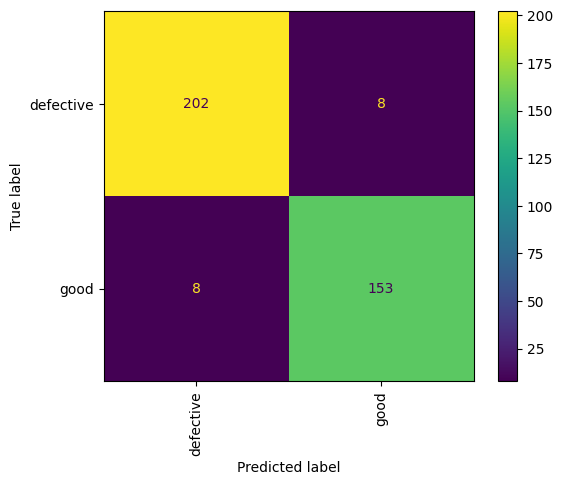

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report, ConfusionMatrixDisplay

f1_scores=[]
precision_scores=[]
recall_scores=[]

f1_scores.append(f1_score(y_pred, y_val, average="macro"))
precision_scores.append(precision_score(y_pred, y_val, average="macro"))
recall_scores.append(recall_score(y_pred, y_val, average="macro"))


# Print the Results
print(f"F1-Score:{f1_scores}")
print(f"Precision:{precision_scores}")
print(f"Recall:{recall_scores}")



print("Classification_Report")
print("-----------------------")
print(classification_report(y_val,y_pred))
print("Confusion_Matrix")
print("----------------------")
ConfusionMatrixDisplay.from_predictions(y_val, y_pred, display_labels=class_names, xticks_rotation="vertical")
plt.show()


In [16]:
model_name=["VGG19"]
result_df= pd.DataFrame({"F1_Score":f1_scores, "Precision_Score":precision_scores, "Recall_Score":recall_scores}, index=model_name)
result_df= result_df.T.sort_values(by="VGG19", ascending=False)
result_df

,VGG19
F1_Score,0.956108
Precision_Score,0.956108
Recall_Score,0.956108


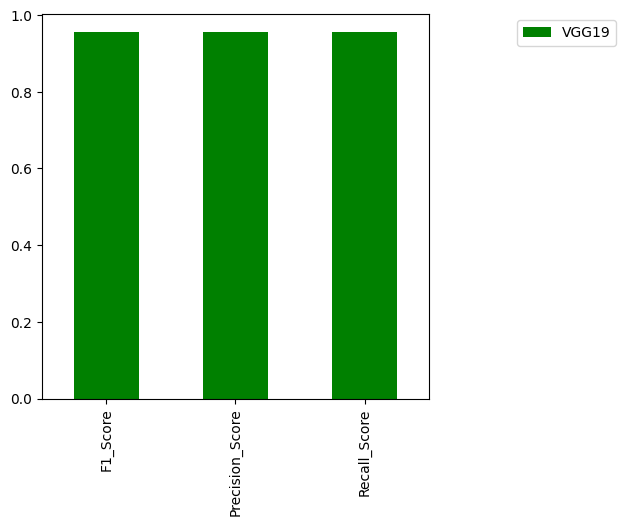

In [17]:
result_df.plot(kind="bar",figsize=(5,5), color="Green").legend(bbox_to_anchor=(1.5,1))